In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/deepfake-database/deepfake_database/validation/real/67_276.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/90_120.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/36_258.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/39_372.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/64_148.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/97_114.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/102_106.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/60_306.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/101_280.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/57_222.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/87_596.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/96_324.jpg
/kaggle/input/deepfake-database/deepfake_database/validation/real/98_171.j

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import glob
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing import image
import seaborn as sns
from sklearn import metrics

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
main_path = '/kaggle/input/deepfake-database/deepfake_database'

train_dir = os.path.join(main_path, 'train')
valid_dir = os.path.join(main_path, 'validation')
test_dir = os.path.join(main_path, 'test')

In [4]:
print("Train_dir Subfolders: ", os.listdir(train_dir))
print("Valid_dir Subfolders: ", os.listdir(valid_dir))
print("Test_dir Subfolders: ", os.listdir(test_dir))

Train_dir Subfolders:  ['real', 'df']
Valid_dir Subfolders:  ['real', 'df']
Test_dir Subfolders:  ['real', 'df']


In [5]:
images_df = {
    "folder":[],
    "image_path":[],
    "label":[]
}

for folder in os.listdir(main_path): #iterate on each train, valid and test folder
    for label in os.listdir(main_path + "/" + folder): #iterate on fake and real folders (labels)
        for img in glob.glob(main_path + "/" + folder + "/" + label + "/*.jpg"):
            images_df["folder"].append(folder)
            images_df["image_path"].append(img)
            images_df["label"].append(label)

In [6]:
images_df = pd.DataFrame(images_df)

In [8]:
images_df

,folder,image_path,label
0,validation,/kaggle/input/deepfake-database/deepfake_datab...,real
1,validation,/kaggle/input/deepfake-database/deepfake_datab...,real
2,validation,/kaggle/input/deepfake-database/deepfake_datab...,real
3,validation,/kaggle/input/deepfake-database/deepfake_datab...,real
4,validation,/kaggle/input/deepfake-database/deepfake_datab...,real
...,...,...,...
19451,train,/kaggle/input/deepfake-database/deepfake_datab...,df
19452,train,/kaggle/input/deepfake-database/deepfake_datab...,df
19453,train,/kaggle/input/deepfake-database/deepfake_datab...,df
19454,train,/kaggle/input/deepfake-database/deepfake_datab...,df


In [9]:
real_grouped_df = images_df[images_df['label'] == "real"].groupby('folder')
fake_grouped_df = images_df[images_df['label'] == "df"].groupby('folder')

In [10]:
real_grouped_df.size()

folder
test           165
train         7084
validation    4259
dtype: int64

In [11]:
fake_grouped_df.size()

folder
test           165
train         4938
validation    2845
dtype: int64

In [12]:
image_train_gen = tf.keras.preprocessing.image.ImageDataGenerator(
                                  rescale=1./255.,
                                  horizontal_flip=True,
                                  )

image_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

In [13]:
train_ds = image_train_gen.flow_from_directory(
    train_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary',
)

valid_ds = image_gen.flow_from_directory(
    valid_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary'
)

test_ds = image_gen.flow_from_directory(
    test_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary',
    shuffle=False) #shuffle disabled

Found 12023 images belonging to 2 classes.
Found 7104 images belonging to 2 classes.
Found 330 images belonging to 2 classes.


In [14]:
def plot_images(img, label):
    plt.figure(figsize=[12, 12])
    for i in range(16):
        plt.subplot(4, 4, i+1)
        plt.imshow(img[i])
        plt.axis('off')
        if label[i] == 0:
            plt.title("Fake")
        else:
            plt.title("Real")

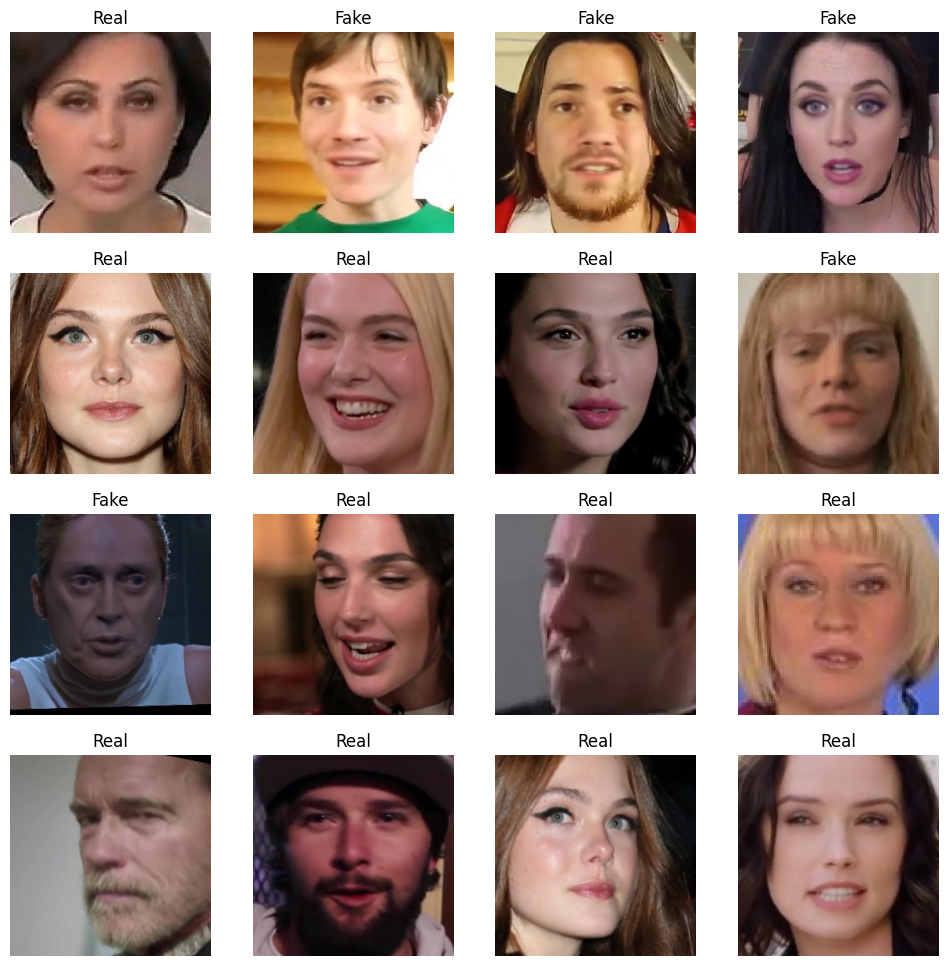

In [15]:
img,lbl = next(train_ds)
plot_images(img,lbl)

In [16]:
for img, label in train_ds:
    print("Values: ", img[0])
    print("Label: ", label[0])
    break

Values:  [[[0.7607844  0.42352945 0.3647059 ]
  [0.7490196  0.41176474 0.3529412 ]
  [0.7490196  0.41176474 0.3529412 ]
  ...
  [0.7019608  0.90196085 0.28627452]
  [0.7019608  0.90196085 0.28627452]
  [0.7019608  0.90196085 0.28627452]]

 [[0.74509805 0.41960788 0.35686275]
  [0.7411765  0.4156863  0.3529412 ]
  [0.7411765  0.4156863  0.3529412 ]
  ...
  [0.7019608  0.90196085 0.28627452]
  [0.7019608  0.90196085 0.28627452]
  [0.7019608  0.90196085 0.28627452]]

 [[0.7372549  0.41176474 0.34901962]
  [0.7411765  0.4156863  0.3529412 ]
  [0.7411765  0.4156863  0.3529412 ]
  ...
  [0.69803923 0.8980393  0.28235295]
  [0.69803923 0.8980393  0.28235295]
  [0.69803923 0.8980393  0.28235295]]

 ...

 [[0.9176471  0.9294118  0.854902  ]
  [0.9215687  0.9333334  0.8588236 ]
  [0.9215687  0.9333334  0.8588236 ]
  ...
  [0.9607844  0.95294124 0.8705883 ]
  [0.9058824  0.8980393  0.81568635]
  [0.9058824  0.8980393  0.8000001 ]]

 [[0.9176471  0.9294118  0.854902  ]
  [0.9215687  0.9333334  0.8

In [17]:
for img, label in train_ds:
    print(img.shape)
    print(label.shape)
    break

(64, 256, 256, 3)
(64,)


In [18]:
train_ds.class_indices

{'df': 0, 'real': 1}

In [19]:
input_shape = (256, 256, 3) #define the input shape of our data

CNN

In [20]:
import tensorflow as tf
from tensorflow.keras import layers

def get_custom_cnn_model(input_shape):
    model = tf.keras.Sequential()

    # Convolutional layers
    model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))
    
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    
    model.add(layers.Conv2D(256, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Flatten layer
    model.add(layers.Flatten())

    # Fully connected layers
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.3))

    # Output layer for binary classification
    model.add(layers.Dense(1, activation='sigmoid'))

    model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
    
    return model

# Define the input shape, e.g., (128, 128, 3) for 128x128 color images

custom_cnn_model = get_custom_cnn_model(input_shape)

In [21]:
custom_cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 64)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 128)     73856     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 256)       295168    
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 30, 30, 256)       0

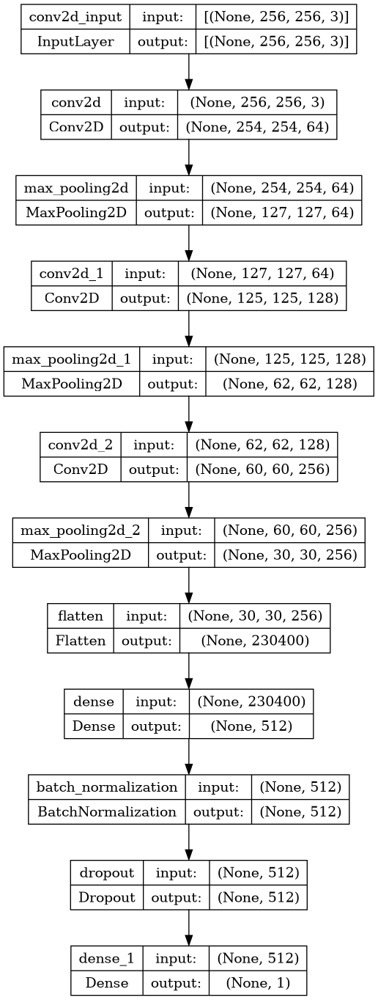

In [22]:
tf.keras.utils.plot_model(custom_cnn_model, show_shapes=True)

In [23]:
checkpoint_filepath = "model_cp.h5"

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min', #minimize the loss value
    save_best_only=True)

In [24]:
early_stopping_cb = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                     patience=5,
                                                     restore_best_weights=True,
                                                    )

In [25]:
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                 factor=0.2,
                                                 patience=3)

In [26]:
history_ft_cnn = custom_cnn_model.fit(train_ds,
                       epochs = 5,
                       validation_data = valid_ds,
                       callbacks=[checkpoint_cb, early_stopping_cb, reduce_lr])

Epoch 1/5
188/188 [==============================] - 119s 570ms/step - loss: 0.3677 - accuracy: 0.8361 - val_loss: 0.7899 - val_accuracy: 0.6736 - lr: 0.0010
Epoch 2/5
188/188 [==============================] - 68s 363ms/step - loss: 0.2400 - accuracy: 0.8989 - val_loss: 0.5008 - val_accuracy: 0.7935 - lr: 0.0010
Epoch 3/5
188/188 [==============================] - 67s 354ms/step - loss: 0.1955 - accuracy: 0.9182 - val_loss: 0.6897 - val_accuracy: 0.7289 - lr: 0.0010
Epoch 4/5
188/188 [==============================] - 67s 357ms/step - loss: 0.1560 - accuracy: 0.9405 - val_loss: 0.2443 - val_accuracy: 0.8967 - lr: 0.0010
Epoch 5/5
188/188 [==============================] - 65s 346ms/step - loss: 0.1429 - accuracy: 0.9469 - val_loss: 1.3034 - val_accuracy: 0.6633 - lr: 0.0010


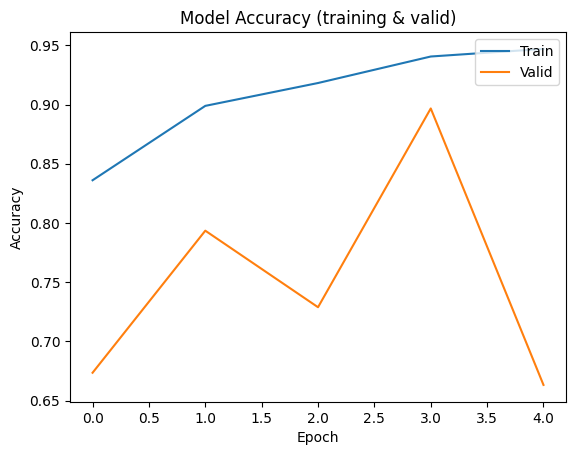

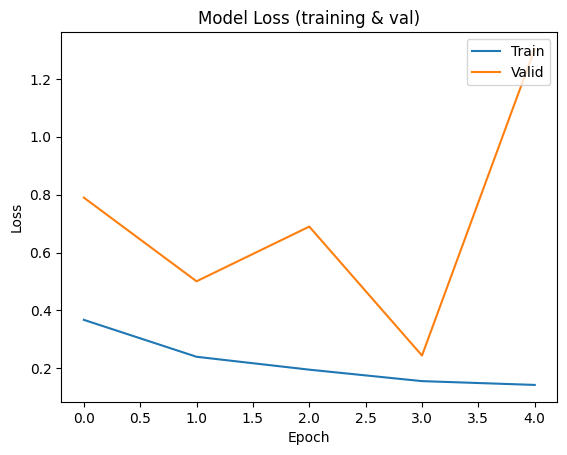

In [27]:
plt.plot(history_ft_cnn.history['accuracy'])
plt.plot(history_ft_cnn.history['val_accuracy'])
plt.title('Model Accuracy (training & valid)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()


plt.plot(history_ft_cnn.history['loss'])
plt.plot(history_ft_cnn.history['val_loss'])
plt.title('Model Loss (training & val)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()

In [28]:
# Evaluate the model on the test set
test_loss, test_acc = custom_cnn_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_acc)

6/6 [==============================] - 2s 361ms/step - loss: 2.4592 - accuracy: 0.5000
Test Loss: 2.4592204093933105
Test Accuracy: 0.5


1/1 [==============================] - 0s 21ms/step


Text(0.5, 1.0, 'This image is 0.00% Fake and 100.00% Real.')

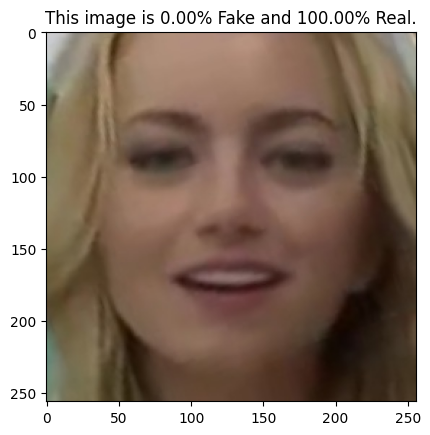

In [40]:
#real example
test_image = tf.keras.preprocessing.image.load_img('/kaggle/input/deepfake-database/deepfake_database/test/df/df04963.jpg', target_size=(256, 256, 3))
plt.imshow(test_image)


test_image_arr = tf.keras.preprocessing.image.img_to_array(test_image)
test_image_arr = np.expand_dims(test_image, axis=0)
test_image_arr = test_image_arr/255.


result = custom_cnn_model.predict(test_image_arr)

plt.title(f"This image is {100 * (1 - result[0][0]):.2f}% Fake and {100 * result[0][0]:.2f}% Real.")


In [47]:
predicted_labels = custom_cnn_model.predict(test_ds)
true_labels = test_ds.classes

6/6 [==============================] - 1s 165ms/step


In [49]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

accuracy = accuracy_score(true_labels, predicted_labels.round())
precision = precision_score(true_labels, predicted_labels.round())
recall = recall_score(true_labels, predicted_labels.round())
f1 = f1_score(true_labels, predicted_labels.round())

# Print the results
print("Confusion Matrix:")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Confusion Matrix:
Accuracy: 0.5
Precision: 0.5
Recall: 1.0
F1 Score: 0.6666666666666666


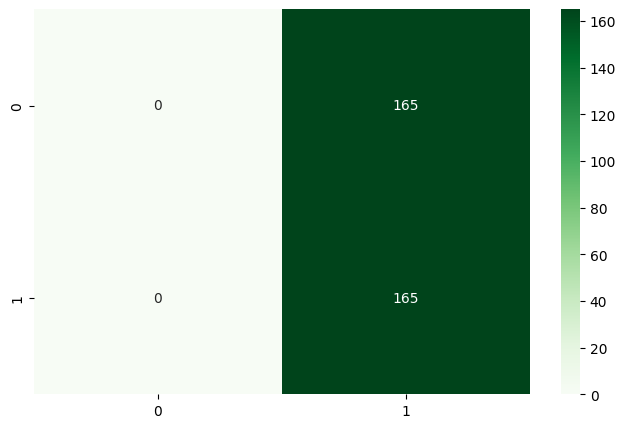

In [42]:
true_labels = test_ds.classes
plt.figure(figsize = (8,5))
sns.heatmap(metrics.confusion_matrix(true_labels, predicted_labels.round()), annot = True,fmt="d",cmap = "Greens")
plt.show()

DENSENET

In [29]:
#create the model's architecture and compile it
def get_densenet_model(input_shape):

    input = tf.keras.Input(shape=input_shape)

    densenet = tf.keras.applications.DenseNet121( weights="imagenet", include_top=False, input_tensor = input)

    x = tf.keras.layers.GlobalAveragePooling2D()(densenet.output)
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    output = tf.keras.layers.Dense(1, activation='sigmoid')(x) #binary classification

    model = tf.keras.Model(densenet.input, output)

    model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

    return model


In [30]:
densenet_model = get_densenet_model(input_shape)

densenet_model.summary()

29084464/29084464 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 262, 262, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 128, 128, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  

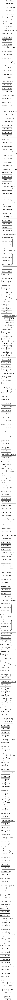

In [31]:
tf.keras.utils.plot_model(densenet_model, show_shapes=True)

In [32]:
history_ft_densenet = densenet_model.fit(train_ds,
                       epochs = 5,
                       validation_data = valid_ds,
                       callbacks=[checkpoint_cb, early_stopping_cb, reduce_lr])

Epoch 1/5
188/188 [==============================] - 183s 610ms/step - loss: 0.1405 - accuracy: 0.9466 - val_loss: 1.5838 - val_accuracy: 0.7321 - lr: 0.0010
Epoch 2/5
188/188 [==============================] - 103s 545ms/step - loss: 0.0495 - accuracy: 0.9834 - val_loss: 0.2482 - val_accuracy: 0.9220 - lr: 0.0010
Epoch 3/5
188/188 [==============================] - 102s 544ms/step - loss: 0.0389 - accuracy: 0.9857 - val_loss: 0.2637 - val_accuracy: 0.9291 - lr: 0.0010
Epoch 4/5
188/188 [==============================] - 102s 544ms/step - loss: 0.0307 - accuracy: 0.9886 - val_loss: 0.4480 - val_accuracy: 0.8906 - lr: 0.0010
Epoch 5/5
188/188 [==============================] - 102s 543ms/step - loss: 0.0192 - accuracy: 0.9928 - val_loss: 0.2607 - val_accuracy: 0.9250 - lr: 0.0010


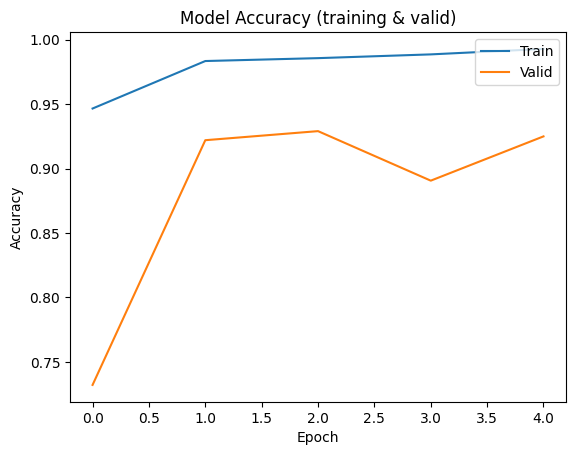

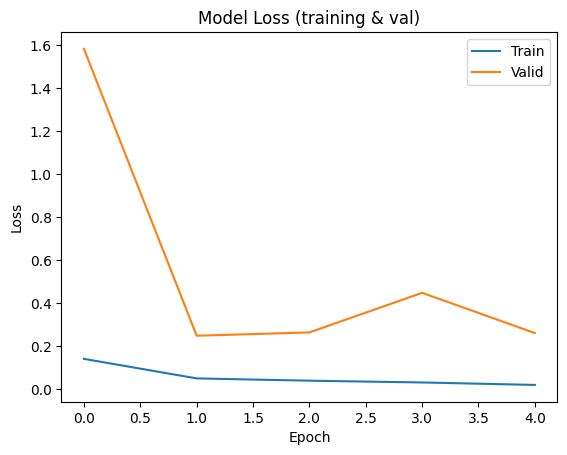

In [33]:
plt.plot(history_ft_densenet.history['accuracy'])
plt.plot(history_ft_densenet.history['val_accuracy'])
plt.title('Model Accuracy (training & valid)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()


plt.plot(history_ft_densenet.history['loss'])
plt.plot(history_ft_densenet.history['val_loss'])
plt.title('Model Loss (training & val)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()

In [34]:
# Evaluate the model on the test set
test_loss, test_acc = densenet_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_acc)

6/6 [==============================] - 3s 440ms/step - loss: 0.7265 - accuracy: 0.8333
Test Loss: 0.7265018224716187
Test Accuracy: 0.8333333134651184


1/1 [==============================] - 3s 3s/step


Text(0.5, 1.0, 'This image is 99.38% Fake and 0.62% Real.')

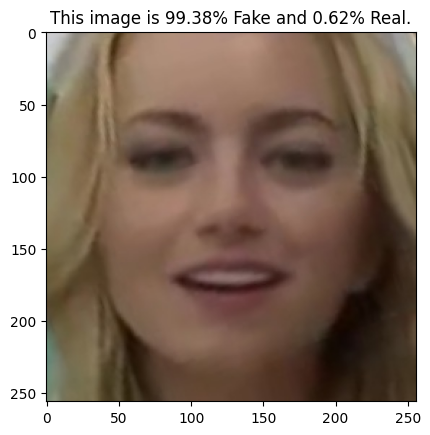

In [50]:
#real example
test_image = tf.keras.preprocessing.image.load_img('/kaggle/input/deepfake-database/deepfake_database/test/df/df04963.jpg', target_size=(256, 256, 3))
plt.imshow(test_image)


test_image_arr = tf.keras.preprocessing.image.img_to_array(test_image)
test_image_arr = np.expand_dims(test_image, axis=0)
test_image_arr = test_image_arr/255.


result = densenet_model.predict(test_image_arr)

plt.title(f"This image is {100 * (1 - result[0][0]):.2f}% Fake and {100 * result[0][0]:.2f}% Real.")


In [53]:
predicted_labels1 = densenet_model.predict(test_ds)
true_labels = test_ds.classes

6/6 [==============================] - 3s 197ms/step


In [54]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

accuracy1 = accuracy_score(true_labels, predicted_labels1.round())
precision1 = precision_score(true_labels, predicted_labels1.round())
recall1 = recall_score(true_labels, predicted_labels1.round())
f11 = f1_score(true_labels, predicted_labels1.round())

# Print the results
print("Confusion Matrix:")
print("Accuracy:", accuracy1)
print("Precision:", precision1)
print("Recall:", recall1)
print("F1 Score:", f11)

Confusion Matrix:
Accuracy: 0.8333333333333334
Precision: 0.75
Recall: 1.0
F1 Score: 0.8571428571428571


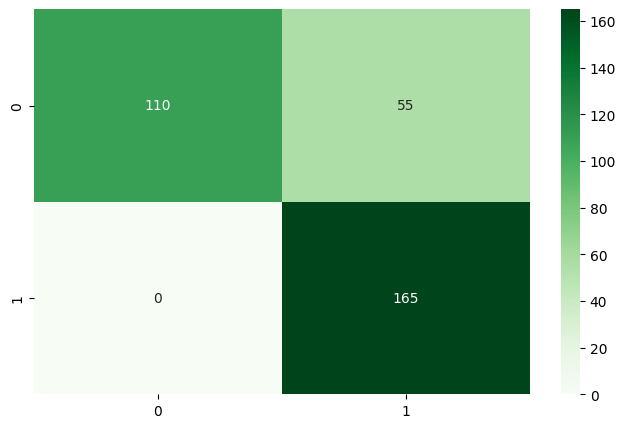

In [55]:
plt.figure(figsize = (8,5))
sns.heatmap(metrics.confusion_matrix(true_labels, predicted_labels1.round()), annot = True,fmt="d",cmap = "Greens")
plt.show()

XCEPTION

In [56]:
#create the model's architecture and compile it
def get_xcp_model(input_shape):

    input = tf.keras.Input(shape=input_shape)

    xception = tf.keras.applications.Xception( weights="imagenet", include_top=False, input_tensor = input)

    x = tf.keras.layers.GlobalAveragePooling2D()(xception.output)
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    output = tf.keras.layers.Dense(1, activation='sigmoid')(x) #binary classification

    model = tf.keras.Model(xception.input, output)

    model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

    return model


In [57]:
xcp_model = get_xcp_model(input_shape)

83683744/83683744 [==============================] - 1s 0us/step


In [58]:
xcp_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 127, 127, 32)         864       ['input_2[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, 127, 127, 32)         128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati  (None, 127, 127, 32)         0         ['block1_conv1_bn[0][0]'

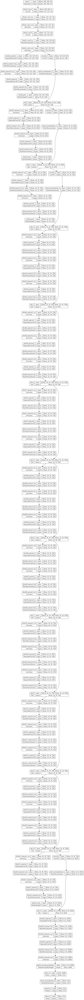

In [59]:
tf.keras.utils.plot_model(xcp_model, show_shapes=True)

In [61]:
history_ft_xception = xcp_model.fit(train_ds,
                       epochs = 5,
                       validation_data = valid_ds,
                       callbacks=[checkpoint_cb, early_stopping_cb, reduce_lr])

Epoch 1/5
188/188 [==============================] - 190s 838ms/step - loss: 0.0890 - accuracy: 0.9664 - val_loss: 0.4559 - val_accuracy: 0.8666 - lr: 0.0010
Epoch 2/5
188/188 [==============================] - 145s 769ms/step - loss: 0.0298 - accuracy: 0.9908 - val_loss: 0.1960 - val_accuracy: 0.9497 - lr: 0.0010
Epoch 3/5
188/188 [==============================] - 144s 765ms/step - loss: 0.0191 - accuracy: 0.9935 - val_loss: 0.2379 - val_accuracy: 0.9455 - lr: 0.0010
Epoch 4/5
188/188 [==============================] - 144s 765ms/step - loss: 0.0186 - accuracy: 0.9948 - val_loss: 0.1608 - val_accuracy: 0.9496 - lr: 0.0010
Epoch 5/5
188/188 [==============================] - 144s 768ms/step - loss: 0.0143 - accuracy: 0.9946 - val_loss: 0.1402 - val_accuracy: 0.9505 - lr: 0.0010


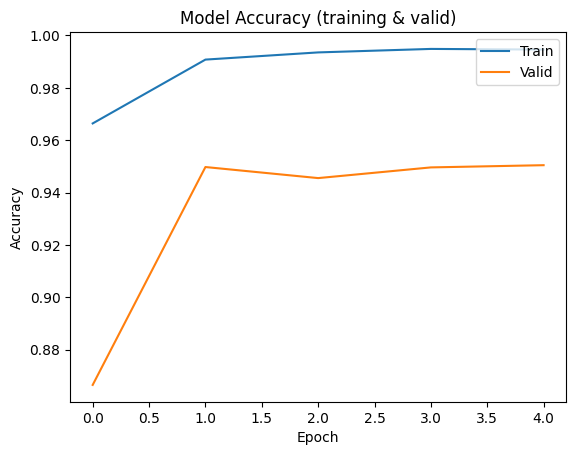

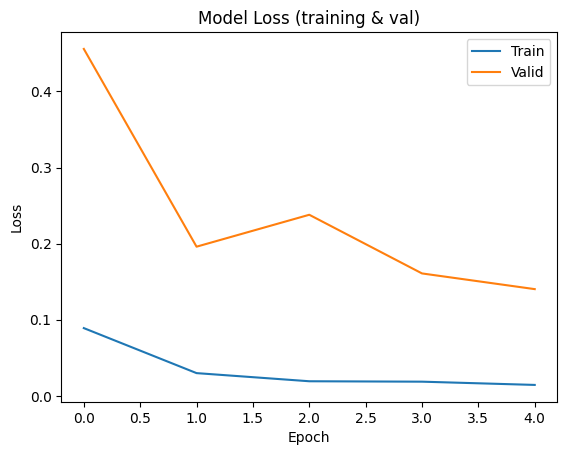

In [62]:
plt.plot(history_ft_xception.history['accuracy'])
plt.plot(history_ft_xception.history['val_accuracy'])
plt.title('Model Accuracy (training & valid)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()


plt.plot(history_ft_xception.history['loss'])
plt.plot(history_ft_xception.history['val_loss'])
plt.title('Model Loss (training & val)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()

In [63]:
# Evaluate the model on the test set
test_loss, test_acc = xcp_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_acc)

6/6 [==============================] - 2s 290ms/step - loss: 0.6274 - accuracy: 0.7939
Test Loss: 0.6273970603942871
Test Accuracy: 0.7939394116401672


1/1 [==============================] - 2s 2s/step


Text(0.5, 1.0, 'This image is 99.96% Fake and 0.04% Real.')

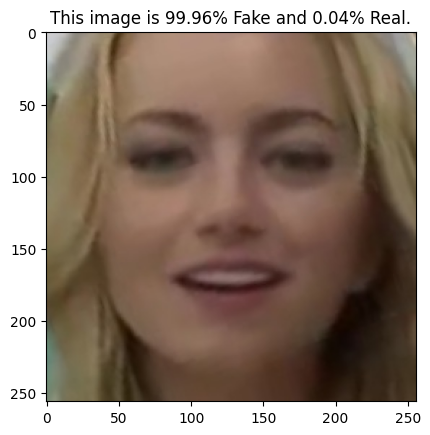

In [65]:
#real example
test_image = tf.keras.preprocessing.image.load_img('/kaggle/input/deepfake-database/deepfake_database/test/df/df04963.jpg', target_size=(256, 256, 3))
plt.imshow(test_image)


test_image_arr = tf.keras.preprocessing.image.img_to_array(test_image)
test_image_arr = np.expand_dims(test_image, axis=0)
test_image_arr = test_image_arr/255.


result = xcp_model.predict(test_image_arr)

plt.title(f"This image is {100 * (1 - result[0][0]):.2f}% Fake and {100 * result[0][0]:.2f}% Real.")


In [66]:
predicted_labels2 = xcp_model.predict(test_ds)
true_labels = test_ds.classes

6/6 [==============================] - 2s 188ms/step


In [67]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

accuracy2 = accuracy_score(true_labels, predicted_labels2.round())
precision2 = precision_score(true_labels, predicted_labels2.round())
recall2 = recall_score(true_labels, predicted_labels2.round())
f12 = f1_score(true_labels, predicted_labels2.round())

# Print the results
print("Confusion Matrix:")
print("Accuracy:", accuracy2)
print("Precision:", precision2)
print("Recall:", recall2)
print("F1 Score:", f12)

Confusion Matrix:
Accuracy: 0.793939393939394
Precision: 0.70995670995671
Recall: 0.9939393939393939
F1 Score: 0.8282828282828282


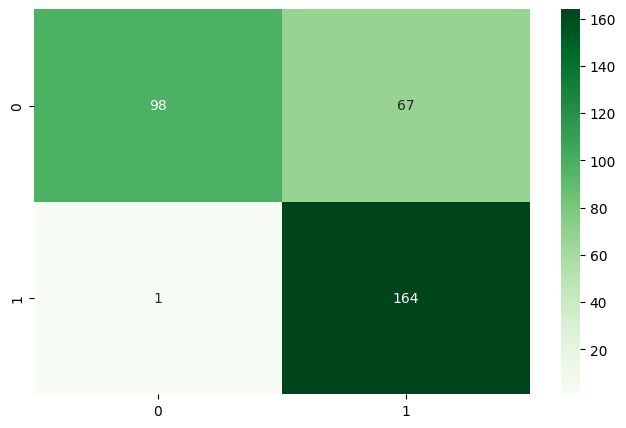

In [68]:
plt.figure(figsize = (8,5))
sns.heatmap(metrics.confusion_matrix(true_labels, predicted_labels2.round()), annot = True,fmt="d",cmap = "Greens")
plt.show()